<a href="https://colab.research.google.com/github/taibaseddeq/Classification-task-Music-Genre/blob/main/Team1_G11_Final_Project_Shai_Tranining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Final project Shai AI Training <br>
Team1 Group11 <br>
the members: Taiba Seddeq, Lara Faroun <br>
the monter:Eng. Wesam Al-Suhli**

# 1.Framing the Problem

# **Dataset Description**

It is a classification task. the dataset is "music genre", thus The 'class' column is the label. The description of columns: <br>
**artist:** Name of the Artist. <br>

**Track Name:** Name of the Track. <br>

**popularity:** The higher the value, the more popular the song is. <br>

**danceability:** Danceability describes how suitable a track is for dancing, based on a combination of musical elements including tempo, rhythm. <br>

**energy:** Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. <br>

**key:** The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.. <br>

**loudness:** The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative. <br>

**mode:** Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0. <br>

**speechiness:** Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks. <br>

**acousticness:** A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic. <br>

**instrumentalness:** Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0. <br>

**liveness:** Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live. <br>

**valence:** A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry). <br>

**tempo:** The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration. <br>

**duration in milliseconds:** Time of the song. <br>

**time_signature:** a notational convention used in Western musical notation to specify how many beats (pulses) are contained in each measure (bar), and which note value is equivalent to a beat. <br>

**Class:** Genre of the track. <br>

#### **Setting-up Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Getting the Data

In [ ]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

# 2.Discovering the data

## Overview

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(train, title='Pandas Profiling Report', html={'style':{'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train.head(20)

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,0,"Lata Mangeshkar, Hariharan",Likha Hai Yeh,23.0,0.370,0.670,7.0,-11.007,0,0.0445,0.809000,0.000006,0.2360,0.802,177.164,5.209333,3,3
1,1,Kalan.FrFr,No Love ft. Mozzy & Cypress Moreno,45.0,0.659,0.639,6.0,-8.138,1,0.3880,0.416000,NaN,0.1160,0.688,99.517,206602.000000,4,5
2,2,The Cure,Play For Today,51.0,0.458,0.731,11.0,-12.049,0,0.1450,0.048700,0.021500,0.1160,0.784,80.425,218960.000000,4,6
3,3,Miguel Poveda,Coplas Del Querer,40.0,0.508,0.287,5.0,-8.898,0,0.0481,0.834000,NaN,0.0963,0.324,96.139,332467.000000,3,9
4,4,Leif Vollebekk,Long Blue Light,63.0,0.552,0.485,9.0,-9.111,1,0.0332,0.517000,0.106000,0.1640,0.510,71.548,200173.000000,4,1
5,5,The Police,Every Little Thing She Does Is Magic,74.0,0.558,0.768,2.0,-9.997,1,0.0343,0.121000,0.062600,0.1240,0.429,81.909,260573.000000,4,10
6,6,Hozier,Say My Name - Recorded at Spotify Studios NYC,55.0,0.607,0.462,NaN,-8.383,1,0.0551,0.520000,0.000018,0.2290,0.376,117.410,4.456883,4,0
7,7,Simon Westman Trio,Jakob’s Happy Song,47.0,0.384,0.390,11.0,-17.377,1,0.0275,0.840000,0.899000,0.1020,0.687,105.386,5.539867,4,7
8,8,Guns N' Roses,Welcome To The Jungle,NaN,0.456,0.978,10.0,-4.869,0,0.1120,0.030100,0.499000,0.3130,0.327,123.411,4.531117,4,10
9,9,Vincenzo Martinelli,Soleares,43.0,0.373,0.306,2.0,-15.707,1,0.0393,0.388000,0.925000,0.1030,0.464,107.770,3.549550,3,7


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14396 entries, 0 to 14395
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  14396 non-null  int64  
 1   Artist Name         14396 non-null  object 
 2   Track Name          14396 non-null  object 
 3   Popularity          14045 non-null  float64
 4   danceability        14396 non-null  float64
 5   energy              14396 non-null  float64
 6   key                 12784 non-null  float64
 7   loudness            14396 non-null  float64
 8   mode                14396 non-null  int64  
 9   speechiness         14396 non-null  float64
 10  acousticness        14396 non-null  float64
 11  instrumentalness    10837 non-null  float64
 12  liveness            14396 non-null  float64
 13  valence             14396 non-null  float64
 14  tempo               14396 non-null  float64
 15  duration_in min/ms  14396 non-null  float64
 16  time

### Categorical columns:

In [ ]:
 print(train['Track Name'].unique(),', the tracks number =',train['Track Name'].nunique())

['Likha Hai Yeh' 'No Love ft. Mozzy & Cypress Moreno' 'Play For Today' ...
 'WAYO (KPE LE WU)' 'Making a Home' 'Is There Anybody out There?'] , the tracks number = 12396


In [ ]:
train['Track Name'].value_counts()

Dreams                              8
Hurricane                           7
Forever                             7
Runaway                             7
Fire                                7
                                   ..
El Sicuri                           1
Like a Hurricane - 2003 Remaster    1
Necrogenic Resurrection             1
Love's Gonna Live Here              1
Is There Anybody out There?         1
Name: Track Name, Length: 12396, dtype: int64

In [ ]:
 print(train['Artist Name'].unique(),', the Artists number =',train['Artist Name'].nunique())

['Lata Mangeshkar, Hariharan' 'Kalan.FrFr' 'The Cure' ... 'Maddie Medley'
 'Ólafur Arnalds, Alice Sara Ott' 'WurlD'] , the Artists number = 7891


In [ ]:
train['Artist Name'].value_counts()

Backstreet Boys                  59
Westlife                         48
Britney Spears                   43
Eyal Golan                       42
Omer Adam                        34
                                 ..
Luz                               1
Ammonia                           1
Velvet Two Stripes                1
Mahendra Kapoor, Manhar Udhas     1
WurlD                             1
Name: Artist Name, Length: 7891, dtype: int64

In [ ]:
train['Artist Name'].mode()

0    Backstreet Boys
dtype: object

### Numerical Columns:

In [ ]:
train.describe()

,id,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
count,14396.000000,14045.000000,14396.000000,14396.000000,12784.000000,14396.000000,14396.000000,14396.000000,14396.000000,10837.000000,14396.000000,14396.000000,14396.000000,1.439600e+04,14396.000000,14396.000000
mean,7197.500000,44.591954,0.542981,0.663347,5.957838,-7.897393,0.638580,0.079479,0.246606,0.177489,0.195594,0.486931,122.729981,2.009550e+05,3.927341,6.695679
std,4155.911573,17.436540,0.166668,0.235709,3.190628,4.063214,0.480429,0.083048,0.310371,0.304133,0.158487,0.240281,29.558253,1.118463e+05,0.352828,3.206170
min,0.000000,1.000000,0.059600,0.000020,1.000000,-39.952000,0.000000,0.022500,0.000000,0.000001,0.013600,0.018300,34.132000,5.339167e-01,1.000000,0.000000
25%,3598.750000,33.000000,0.430000,0.510000,3.000000,-9.525250,0.000000,0.034800,0.004208,0.000088,0.097400,0.299000,99.799000,1.669988e+05,4.000000,5.000000
50%,7197.500000,44.000000,0.545000,0.701000,6.000000,-7.006000,1.000000,0.047400,0.080750,0.003920,0.129000,0.481000,120.069500,2.095845e+05,4.000000,8.000000
75%,10796.250000,56.000000,0.659000,0.861000,9.000000,-5.161000,1.000000,0.082500,0.434000,0.199000,0.257000,0.673000,141.990250,2.522970e+05,4.000000,10.000000
max,14395.000000,100.000000,0.989000,0.999000,11.000000,1.355000,1.000000,0.955000,0.996000,0.996000,1.000000,0.986000,217.416000,1.477187e+06,5.000000,10.000000


# 3.Visualizing and Analyzing the Data

In [ ]:
num_col = train[['Popularity','danceability','energy','key','loudness',
                 'mode','speechiness','acousticness','instrumentalness','liveness',
                 'valence','tempo','duration_in min/ms','time_signature','Class']]

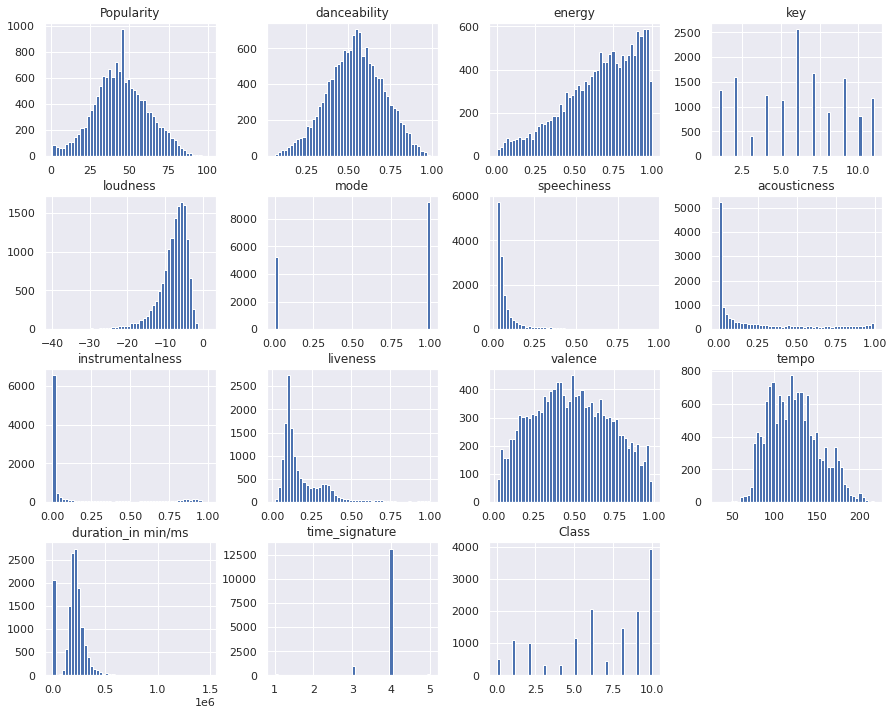

In [ ]:
num_col.hist(bins=50, figsize=(15,12))
plt.show()

In [ ]:
train['time_signature'].value_counts()

4    13200
3      953
5      159
1       84
Name: time_signature, dtype: int64

**Notes** <br>
types of distributions: <br>
**discrete** >>> key, mode, time_signature, class <br>
**continuous** >>> <br>
left-skewed dist. >> energy <br>
normal dist. >> popularity, danceability, valence, tempo <br>
 Columns have range from 0.0 to 1.0: acousticness, danceability, speechiness,valence, energy, instrumentalness, liveness, mode


In [ ]:
disc_col=train[['key','mode','time_signature','Class']]

In [ ]:
cont_col= train[['Popularity','danceability','energy','loudness','speechiness','acousticness',
            'instrumentalness','liveness','valence','tempo','duration_in min/ms']]

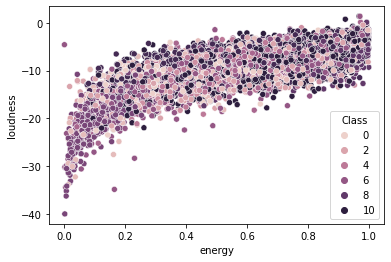

In [ ]:
sns.scatterplot(data=train, x=train.energy, y=train.loudness, hue="Class")

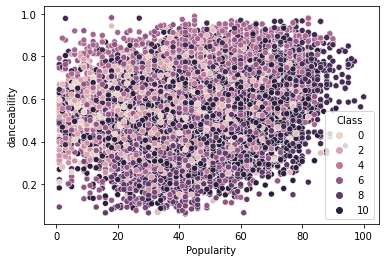

In [ ]:
sns.scatterplot(data=train, x=train.Popularity, y=train.danceability, hue="Class")

<AxesSubplot:>

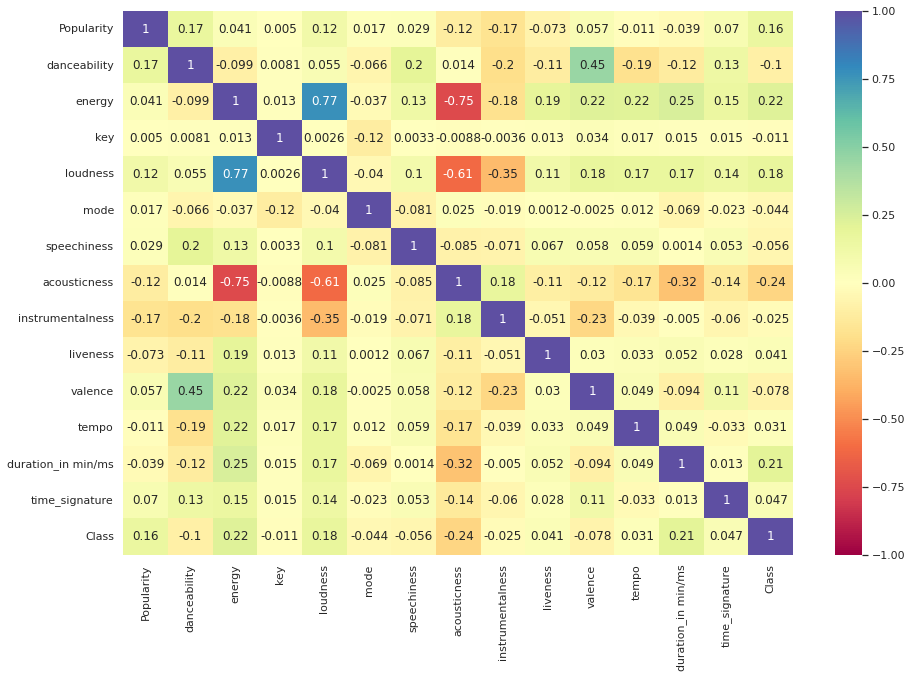

In [ ]:
sns.set(rc = {'figure.figsize':(15,10)})
sns.heatmap(num_col.corr(),cmap="Spectral",vmax=1,vmin=-1,center=0,annot=True)

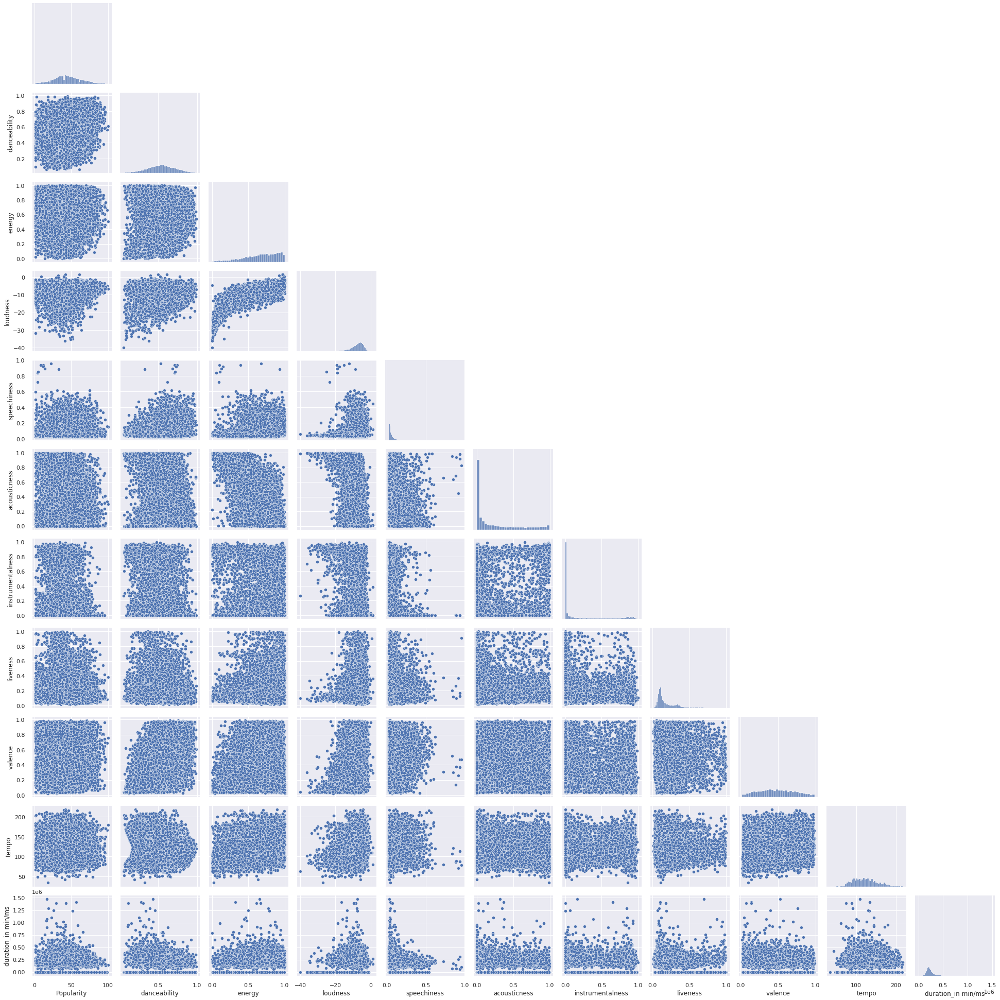

In [ ]:
sns.set(rc = {'figure.figsize':(20,15)})
sns.pairplot(cont_col, corner=True)

energy has a strong direct corr with loudness and both of them have a strong inverse corr with acousticness.
danceability has a good relation with valence.
acousticness has an inverse relation with duration and class.
loudness has an inverse corr with instrumentalness

# 4.Preparing the Data for  modeling

In [ ]:
!pip install pycaret

In [ ]:
import pycaret

In [ ]:
from pycaret.classification import *

In [ ]:
help(setup)

Help on function setup in module pycaret.classification:

setup(data: Union[pandas.core.frame.DataFrame, Callable[[], pandas.core.frame.DataFrame]], target: str, train_size: float = 0.7, test_data: Union[pandas.core.frame.DataFrame, NoneType] = None, preprocess: bool = True, imputation_type: str = 'simple', iterative_imputation_iters: int = 5, categorical_features: Union[List[str], NoneType] = None, categorical_imputation: str = 'constant', categorical_iterative_imputer: Union[str, Any] = 'lightgbm', ordinal_features: Union[Dict[str, list], NoneType] = None, high_cardinality_features: Union[List[str], NoneType] = None, high_cardinality_method: str = 'frequency', numeric_features: Union[List[str], NoneType] = None, numeric_imputation: str = 'mean', numeric_iterative_imputer: Union[str, Any] = 'lightgbm', date_features: Union[List[str], NoneType] = None, ignore_features: Union[List[str], NoneType] = None, normalize: bool = False, normalize_method: str = 'zscore', transformation: bool = F

In [ ]:
clf=setup(data=num_col,target='Class',fix_imbalance=True,normalize=True ,normalize_method='zscore', remove_outliers=False)

,Description,Value
0,session_id,1515
1,Target,Class
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(14396, 15)"
5,Missing Values,True
6,Numeric Features,11
7,Categorical Features,3
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                                                  target='Class')),
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
                ('rem_outliers', 

In [ ]:
compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.4948,0.8379,0.5775,0.4861,0.4883,0.4087,0.4092,6.497
gbc,Gradient Boosting Classifier,0.4940,0.8389,0.5936,0.4910,0.4846,0.4155,0.4177,121.225
rf,Random Forest Classifier,0.4831,0.8055,0.5806,0.4732,0.4743,0.3999,0.4009,7.594
et,Extra Trees Classifier,0.4742,0.7660,0.5504,0.4600,0.4646,0.3851,0.3857,3.864
lr,Logistic Regression,0.4283,0.8101,0.5486,0.4408,0.4102,0.3520,0.3591,8.024
lda,Linear Discriminant Analysis,0.4236,0.7963,0.5448,0.4337,0.4075,0.3456,0.3514,0.438
dt,Decision Tree Classifier,0.3693,0.6329,0.4595,0.3800,0.3710,0.2720,0.2732,1.206
svm,SVM - Linear Kernel,0.3655,0.0000,0.5186,0.3792,0.3216,0.2913,0.3047,1.138
knn,K Neighbors Classifier,0.3553,0.7041,0.4912,0.3991,0.3425,0.2793,0.2884,2.388
nb,Naive Bayes,0.3279,0.7551,0.4292,0.3748,0.3022,0.2501,0.2602,0.355


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1515, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:compare_models() succesfully completed......................................


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1515, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

#### Checking Zeros:

In [ ]:
(train==0).sum()

id                       1
Artist Name              0
Track Name               0
Popularity               0
danceability             0
energy                   0
key                      0
loudness                 0
mode                  5203
speechiness              0
acousticness             2
instrumentalness         0
liveness                 0
valence                  0
tempo                    0
duration_in min/ms       0
time_signature           0
Class                  500
dtype: int64

**The zeros are considered values not missing values.**

#### Checking Null

In [ ]:
train.isnull().sum()

id                       0
Artist Name              0
Track Name               0
Popularity             351
danceability             0
energy                   0
key                   1612
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness      3559
liveness                 0
valence                  0
tempo                    0
duration_in min/ms       0
time_signature           0
Class                    0
dtype: int64

**instrumentalness** has 24.7% nan values approximetly a quarter of the values so we're gonna delete the column or we will not consider it with the training model. the same thing with **key** column.<br>
**Popularity** will be replaced the null with the mean values


In [ ]:
train.key.mode()

0    7.0
dtype: float64

In [ ]:
train['key'].value_counts()

7.0     1684
2.0     1592
9.0     1578
1.0     1329
4.0     1236
11.0    1167
5.0     1125
6.0      948
8.0      899
10.0     814
3.0      412
Name: key, dtype: int64

In [ ]:
train['Popularity']=train.Popularity.fillna(train.Popularity.mode()[0])
train['key']=train.key.fillna(train.key.mode()[0])
train.isnull().sum()

id                       0
Artist Name              0
Track Name               0
Popularity               0
danceability             0
energy                   0
key                      0
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness      3559
liveness                 0
valence                  0
tempo                    0
duration_in min/ms       0
time_signature           0
Class                    0
dtype: int64

In [ ]:
train['key'].value_counts()

7.0     3296
2.0     1592
9.0     1578
1.0     1329
4.0     1236
11.0    1167
5.0     1125
6.0      948
8.0      899
10.0     814
3.0      412
Name: key, dtype: int64

#### Outliers

In [ ]:
upper_limit,lower_limit=np.quantile(train['duration_in min/ms'] , (0.95,0.05))
upper_limit,lower_limit

(354086.75, 3.38789166675)

In [ ]:
outliers1= train[(train['duration_in min/ms'] > upper_limit) | (train['duration_in min/ms'] < lower_limit) ]
outliers1

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
22,22,Monophonics,Last One Standing,60.0,0.588,0.576,6.0,-6.945,0,0.0367,0.218000,0.0357,0.1720,0.6600,129.155,436840.000000,4,9
39,39,Bernard Allison,Rocket 88 - Live,31.0,0.177,0.724,7.0,-9.536,1,0.0487,0.071000,0.0718,0.9580,0.6570,144.803,446207.000000,4,2
45,45,Figueroa,Back to the Stars,35.0,0.417,0.569,4.0,-7.560,1,0.0303,0.000302,0.6060,0.1040,0.0352,140.020,366957.000000,4,1
67,67,Adam Sanders,What If I'm Right,68.0,0.431,0.930,7.0,-3.420,1,0.1070,0.051800,NaN,0.1140,0.5110,167.788,2.770667,4,4
73,73,Blur,Tender,62.0,0.587,0.566,9.0,-9.932,1,0.0276,0.470000,NaN,0.0644,0.5290,76.054,461947.000000,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14322,14322,Maddie & Tae,Woman You Got,67.0,0.523,0.896,10.0,-3.556,1,0.0575,0.105000,NaN,0.1430,0.7290,169.940,2.965850,4,4
14326,14326,C. Ramchandra,Haseenon Se Muhabbat Ka Bura Anjaam,4.0,0.505,0.369,3.0,-10.369,1,0.1470,0.947000,NaN,0.1630,0.5480,160.283,2.979783,5,3
14353,14353,Big Audio Dynamite,E=MC2,50.0,0.721,0.782,2.0,-9.723,0,0.0529,0.716000,NaN,0.2040,0.8440,129.975,354627.000000,4,1
14356,14356,Matteo Vallicelli,Dietrofront,38.0,0.421,0.612,9.0,-8.864,0,0.0286,0.440000,0.9290,0.0996,0.1670,159.993,377533.000000,4,6


In [ ]:
upper,lower=np.quantile(train['speechiness'] , (0.95,0.05))
outliers2 = train[(train['speechiness'] > upper) | (train['speechiness'] < lower) ]
outliers2

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
1,1,Kalan.FrFr,No Love ft. Mozzy & Cypress Moreno,45.0,0.659,0.639,6.0,-8.138,1,0.3880,0.41600,NaN,0.1160,0.688,99.517,206602.000000,4,5
7,7,Simon Westman Trio,Jakob’s Happy Song,47.0,0.384,0.390,11.0,-17.377,1,0.0275,0.84000,0.89900,0.1020,0.687,105.386,5.539867,4,7
16,16,Bleachers,Chinatown (feat. Bruce Springsteen),64.0,0.442,0.689,4.0,-5.289,1,0.0251,0.00458,NaN,0.1100,0.208,89.001,247968.000000,3,10
23,23,North Mississippi Allstars,Katrina,31.0,0.596,0.140,7.0,-13.349,1,0.0273,0.85100,0.00198,0.0948,0.431,80.955,301320.000000,4,2
25,25,Eric Clapton,Let It Grow,48.0,0.420,0.398,4.0,-13.626,1,0.0250,0.21900,0.36000,0.2580,0.267,77.689,298280.000000,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14344,14344,Elton John,Sacrifice - Live,34.0,0.635,0.680,1.0,-6.945,1,0.0268,0.48500,0.00151,0.7380,0.534,113.979,5.340000,4,9
14363,14363,Peled,◊ó◊®◊ß◊ï◊™,22.0,0.624,0.706,11.0,-6.004,0,0.2750,0.03140,NaN,0.4130,0.363,94.167,207467.000000,4,5
14369,14369,Cage The Elephant,Cigarette Daydreams,78.0,0.636,0.676,2.0,-3.442,1,0.0263,0.08070,NaN,0.0831,0.273,113.980,208760.000000,4,6
14371,14371,Everlast,The Culling,38.0,0.681,0.849,1.0,-5.952,1,0.3820,0.03050,NaN,0.3010,0.541,79.004,194160.000000,4,10


In [ ]:
outliers= pd.concat([outliers1,outliers2]).drop_duplicates()
outliers

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
22,22,Monophonics,Last One Standing,60.0,0.588,0.576,6.0,-6.945,0,0.0367,0.218000,0.03570,0.1720,0.6600,129.155,436840.000000,4,9
39,39,Bernard Allison,Rocket 88 - Live,31.0,0.177,0.724,7.0,-9.536,1,0.0487,0.071000,0.07180,0.9580,0.6570,144.803,446207.000000,4,2
45,45,Figueroa,Back to the Stars,35.0,0.417,0.569,4.0,-7.560,1,0.0303,0.000302,0.60600,0.1040,0.0352,140.020,366957.000000,4,1
67,67,Adam Sanders,What If I'm Right,68.0,0.431,0.930,7.0,-3.420,1,0.1070,0.051800,NaN,0.1140,0.5110,167.788,2.770667,4,4
73,73,Blur,Tender,62.0,0.587,0.566,9.0,-9.932,1,0.0276,0.470000,NaN,0.0644,0.5290,76.054,461947.000000,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14344,14344,Elton John,Sacrifice - Live,34.0,0.635,0.680,1.0,-6.945,1,0.0268,0.485000,0.00151,0.7380,0.5340,113.979,5.340000,4,9
14363,14363,Peled,◊ó◊®◊ß◊ï◊™,22.0,0.624,0.706,11.0,-6.004,0,0.2750,0.031400,NaN,0.4130,0.3630,94.167,207467.000000,4,5
14369,14369,Cage The Elephant,Cigarette Daydreams,78.0,0.636,0.676,2.0,-3.442,1,0.0263,0.080700,NaN,0.0831,0.2730,113.980,208760.000000,4,6
14371,14371,Everlast,The Culling,38.0,0.681,0.849,1.0,-5.952,1,0.3820,0.030500,NaN,0.3010,0.5410,79.004,194160.000000,4,10


In [ ]:
train1= train.drop(index=outliers.iloc(),axis=0)
train1.head()

#### Normalizing Distribution

In [ ]:
from scipy.stats import zscore
train.apply(zscore)

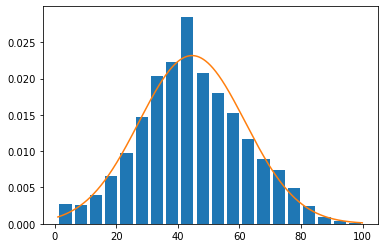

In [ ]:
from scipy.stats import norm
plt.hist(train.Popularity, bins=20, rwidth=0.8, density=True)
rng = np.arange(train.Popularity.min(), train.Popularity.max(), 0.1)
plt.plot(rng, norm.pdf(rng,train.Popularity.mean(),train.Popularity.std()))

In [ ]:
upper_limit = train.Popularity.mean() + 3*train.Popularity.std()
lower_limit =train.Popularity.mean() -3*train.Popularity.std()
outliers3 = train[(train.Popularity>upper_limit) | (train.Popularity<lower_limit)]
outliers3 

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
72,72,Lil Nas X,MONTERO (Call Me By Your Name),100.0,0.610,0.508,8.0,-6.682,0,0.1520,0.2970,NaN,0.3840,0.758,178.818,137876.000000,4,9
5264,5264,Olivia Rodrigo,good 4 u,99.0,0.563,0.664,9.0,-5.044,1,0.1540,0.3350,NaN,0.0849,0.688,166.928,2.969117,4,9
9148,9148,Masked Wolf,Astronaut In The Ocean,97.0,0.778,0.695,4.0,-6.865,0,0.0913,0.1750,NaN,0.1500,0.472,149.996,132780.000000,4,9
9767,9767,"The Kid LAROI, Justin Bieber",STAY (with Justin Bieber),97.0,0.591,0.764,1.0,-5.484,1,0.0483,0.0383,NaN,0.1030,0.478,169.928,2.363433,4,9
9768,9768,"The Kid LAROI, Justin Bieber",STAY (with Justin Bieber),97.0,0.591,0.764,1.0,-5.484,1,0.0483,0.0383,NaN,0.1030,0.478,169.928,2.363433,4,9


**All the values can't be concidered as outliers**

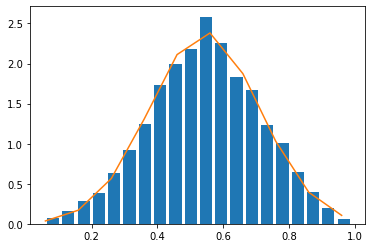

In [ ]:
plt.hist(train.danceability, bins=20, rwidth=0.8, density=True)
rng = np.arange(train.danceability.min(), train.danceability.max(), 0.1)
plt.plot(rng, norm.pdf(rng,train.danceability.mean(),train.danceability.std()))

In [ ]:
upper_limit = train.danceability.mean() + 3*train.danceability.std()
lower_limit =train.danceability.mean() -3*train.danceability.std()
outliers4 = train[(train.danceability>upper_limit) | (train.danceability<lower_limit)]
outliers4

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class


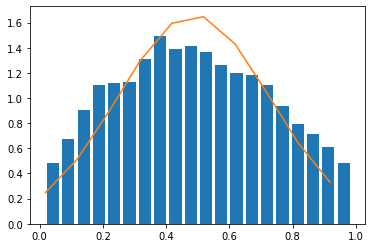

In [ ]:
plt.hist(train.valence, bins=20, rwidth=0.8, density=True)
rng = np.arange(train.valence.min(), train.valence.max(), 0.1)
plt.plot(rng, norm.pdf(rng,train.valence.mean(),train.valence.std()))

In [ ]:
upper_limit = train.valence.mean() + 3*train.valence.std()
lower_limit =train.valence.mean() -3*train.valence.std()
outliers5 = train[(train.valence>upper_limit) | (train.valence<lower_limit)]
outliers5

,id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
126,126,Suicide,Dream Baby Dream,51.0,0.688,0.716,1.0,-10.437,0,0.0320,0.00905,0.732000,0.0921,0.977,144.122,384907.000000,4,1
159,159,Lata Mangeshkar,Mila Hai Kisi Ka Jhumka,3.0,0.412,0.492,5.0,-7.991,1,0.0991,0.87400,0.000002,0.1150,0.969,81.305,2.817783,4,3
341,341,Boney M.,Rasputin - Club Mix,64.0,0.719,0.907,6.0,-5.154,0,0.0502,0.16700,0.001080,0.2450,0.975,127.153,272227.000000,4,9
464,464,Fenne Lily,Alapathy,37.0,0.554,0.911,8.0,-6.282,1,0.0292,0.48200,0.542000,0.0668,0.968,157.621,194973.000000,4,6
524,524,Dove Cameron,LazyBaby,69.0,0.764,0.785,4.0,-3.528,1,0.0330,0.03030,NaN,0.3150,0.974,113.019,161351.000000,4,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13894,13894,JD McPherson,Fire Bug,30.0,0.692,0.843,11.0,-6.660,0,0.0351,0.44800,0.019300,0.0876,0.974,147.306,137813.000000,4,10
13999,13999,Squeeze,Cool For Cats,54.0,0.792,0.747,7.0,-15.366,1,0.1490,0.20200,0.004290,0.2210,0.968,144.150,219827.000000,4,10
14169,14169,Lynn Anderson,Rose Garden,60.0,0.589,0.501,7.0,-11.665,1,0.0310,0.16800,NaN,0.0741,0.969,131.064,2.931117,4,4
14237,14237,The Coral,Dreaming of You,65.0,0.441,0.684,9.0,-7.495,0,0.0310,0.37400,0.000848,0.1080,0.971,199.001,141000.000000,4,6


# 5.preprocessing data

### Pipeline the Predictors

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer

In [ ]:

NumAttribs=list(train[['Popularity','danceability','energy','loudness','speechiness','acousticness','liveness','valence','tempo']])
# CatAttribs= list(train[['Artist Name','Track Name']])

num_pipeline = Pipeline([
 ('imputer', SimpleImputer(strategy="most_frequent")),
 ('pt_scaler', PowerTransformer())])

# ohe = OneHotEncoder()

full_pipeline = ColumnTransformer([
("num", num_pipeline, NumAttribs) ])
# ,("ordinal_encoder", ohe, CatAttribs) ])

### Splitting the predictors & the Label

In [ ]:
Xtrain = train[['Popularity','danceability','energy','loudness','speechiness','acousticness','liveness','valence','tempo']].copy()
ytrain = train[['Class']]

In [ ]:
Xtest =test[['Popularity','danceability','energy','loudness','speechiness','acousticness','liveness','valence','tempo']].copy()
Xtest

,Popularity,danceability,energy,loudness,speechiness,acousticness,liveness,valence,tempo
0,52.0,0.522,0.7260,-4.115,0.0383,0.348000,0.1480,0.3310,161.867
1,69.0,0.754,0.4490,-14.013,0.0615,0.724000,0.1620,0.9730,82.751
2,50.0,0.607,0.4770,-12.904,0.0333,0.708000,0.2530,0.8870,136.614
3,40.0,0.484,0.8720,-5.586,0.0559,0.000384,0.1480,0.3470,150.027
4,64.0,0.639,0.8430,-4.975,0.0362,0.052500,0.0854,0.5280,126.047
...,...,...,...,...,...,...,...,...,...
3595,36.0,0.476,0.7470,-5.768,0.2500,0.007530,0.1730,0.1220,140.268
3596,45.0,0.561,0.8230,-4.851,0.0970,0.002900,0.4920,0.5250,93.504
3597,50.0,0.200,0.2930,-18.822,0.0364,0.013300,0.2540,0.0417,149.445
3598,23.0,0.221,0.0773,-24.881,0.0408,0.925000,0.1270,0.0944,84.594


In [ ]:
Xtrain_prep= full_pipeline.fit_transform(Xtrain)
Xtrain_prep

array([[-1.25493711, -1.03855279, -0.11865296, ...,  0.77037002,
         1.28659462,  1.68071713],
       [ 0.04711868,  0.69048303, -0.25783336, ..., -0.45147081,
         0.8468865 , -0.75550147],
       [ 0.39020218, -0.52067229,  0.17093021, ..., -0.45147081,
         1.21802678, -1.57424536],
       ...,
       [-0.18400149,  0.91749465, -0.68702829, ..., -0.58654931,
         0.74472804, -1.06464823],
       [ 0.21917106, -0.79236295, -0.54490125, ...,  0.7772284 ,
        -0.02094033,  1.21747454],
       [ 1.06530111, -0.81588742,  1.41203336, ...,  1.30011419,
        -0.80179562,  1.70047147]])

# 6.Training Models

### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lr_clf = LogisticRegression()
lr_clf.fit(Xtrain_prep, ytrain)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [ ]:
ytrain_lr_pred = cross_val_predict(lr_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_lr_pred, average="micro")

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

0.42532647957766045

### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt_clf = DecisionTreeClassifier()
dt_clf.fit(Xtrain_prep, ytrain)

In [ ]:
ytrain_dt_pred = cross_val_predict(dt_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_dt_pred, average="micro")

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier()
rf_clf.fit(Xtrain_prep, ytrain)

In [ ]:
ytrain_rf_pred = cross_val_predict(rf_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_rf_pred, average="micro")

### SVM

In [ ]:
from sklearn.svm import SVC

svm_clf = SVC(gamma="auto", random_state=42)
svm_clf.fit(Xtrain_prep, ytrain)

In [ ]:
ytrain_svm_pred = cross_val_predict(svm_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_svm_pred, average="micro")

### K-Nearest Neighbours

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier(weights='distance', n_neighbors=4)
knn_clf.fit(Xtrain_prep, ytrain)


In [ ]:
ytrain_knn_pred = cross_val_predict(knn_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_knn_pred, average="micro")

# 7.Training Ensamble Methods

## Voting Classifiers

### Hard Voting

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=100, random_state=42)
svm_clf = SVC(gamma="scale", random_state=42)

Hvoting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('svc', svm_clf)],
    voting='hard')

Hvoting_clf.fit(Xtrain_prep, ytrain)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


VotingClassifier(estimators=[('lr', LogisticRegression(random_state=42)),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('svc', SVC(random_state=42))])

In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_score, recall_score,f1_score

In [ ]:
ytrain_Hvoting_pred = cross_val_predict(Hvoting_clf, Xtrain_prep, ytrain, cv=3)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

In [ ]:
f1_score(ytrain, ytrain_Hvoting_pred, average="micro")

0.44977771603223116

### Soft Voting

In [ ]:
log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=100, random_state=42)
svm_clf = SVC(gamma="scale", probability=True, random_state=42)

Svoting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('svc', svm_clf)],
    voting='soft')
Svoting_clf.fit(Xtrain_prep, ytrain)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


VotingClassifier(estimators=[('lr', LogisticRegression(random_state=42)),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('svc', SVC(probability=True, random_state=42))],
                 voting='soft')

In [ ]:
ytrain_Svoting_pred = cross_val_predict(Svoting_clf, Xtrain_prep, ytrain, cv=3)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), fo

In [ ]:
f1_score(ytrain, ytrain_Svoting_pred, average="micro")

0.44547096415671017

## Bagging and Pasting

### Bagging

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

bag_clf = BaggingClassifier(
    DecisionTreeClassifier(), n_estimators=500,
    max_samples=100, bootstrap=True, random_state=42)
bag_clf.fit(Xtrain_prep, ytrain)


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_bagging.py:719: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


BaggingClassifier(base_estimator=DecisionTreeClassifier(), max_samples=100,
                  n_estimators=500, random_state=42)

In [ ]:
ytrain_Bagging_pred = cross_val_predict(bag_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_Bagging_pred, average="micro")

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_bagging.py:719: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_bagging.py:719: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_bagging.py:719: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.4331758821894971

### Pasting

https://medium.com/@silvaan/ensemble-methods-bagging-and-pasting-in-scikit-learn-723f4183cdf4

## Boosting

### AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

ada_clf = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=1), n_estimators=200,
    algorithm="SAMME.R", learning_rate=0.5, random_state=42)
ada_clf.fit(Xtrain_prep, ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=0.5, n_estimators=200, random_state=42)

In [ ]:
ytrain_ada_pred = cross_val_predict(ada_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_ada_pred, average="micro")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.30550152820227844

### Gradient Boost

### Extreme Gradient Boost (XGBoosting)

https://www.geeksforgeeks.org/xgboost/

https://www.datacamp.com/tutorial/xgboost-in-python

In [ ]:
import xgboost as xgb

In [ ]:
xgb_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10, random_state=42)
xgb_reg.fit(Xtrain_prep, ytrain)

[14:54:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(random_state=42)

In [ ]:
ytrain_xgb_pred = cross_val_predict(xgb_reg, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_xgb_pred, average="micro")

[14:58:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:58:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:58:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


ValueError: ignored

## Stacking

https://www.geeksforgeeks.org/stacking-in-machine-learning-2/

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.StackingClassifier.html

# Evaluation
using F1 score <br>
F1 = 2 * (precision * recall) / (precision + recall)

https://www.kaggle.com/code/nkitgupta/evaluation-metrics-for-multi-class-classification

In [ ]:
from sklearn.metrics import f1_score

In [ ]:
ytrain_pred = cross_val_predict(Hvoting_clf, Xtrain_prep, ytrain, cv=3)
f1_score(ytrain, ytrain_Hvoting_pred, average="micro")

# 8.Fine-Tuning models

### bayesian optimization

https://www.vantage-ai.com/en/blog/bayesian-optimization-for-quicker-hyperparameter-tuning

### Optuna

In [ ]:
pip install optuna

In [ ]:
# optimizing for random forest & SVC

import sklearn

import optuna

# 1. Define an objective function to be maximized.
def objective(trial):

    # 2. Suggest values for the hyperparameters using a trial object.
    classifier_name = trial.suggest_categorical('classifier', ['SVC', 'RandomForest'])
    if classifier_name == 'SVC':
         svc_c = trial.suggest_float('svc_c', 1e-10, 1e10, log=True)
         classifier_obj = sklearn.svm.SVC(C=svc_c, gamma='auto')
    else:
        rf_max_depth = trial.suggest_int('rf_max_depth', 2, 32, log=True)
        classifier_obj = sklearn.ensemble.RandomForestClassifier(max_depth=rf_max_depth, n_estimators=10)
    ...
    return accuracy

# 3. Create a study object and optimize the objective function.
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

https://github.com/optuna/optuna-examples/blob/main/sklearn/sklearn_simple.py

In [ ]:
# optuna for Boosting optimization

import lightgbm as lgb

import optuna

# 1. Define an objective function to be maximized.
def objective(trial):
    ...

    # 2. Suggest values of the hyperparameters using a trial object.
    param = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
    }

    gbm = lgb.train(param, dtrain)
    ...
    return accuracy

# 3. Create a study object and optimize the objective function.
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

https://github.com/optuna/optuna-examples/blob/main/lightgbm/lightgbm_simple.py

# 9.Presenting the Solution

In [ ]:
final_model= Svoting_clf

In [ ]:
Xtest_prepared = full_pipeline.transform(Xtest)
Xtest_prepared 

array([[ 0.43014892, -0.12588959,  0.26581594, ...,  0.20594058,
        -0.10164307, -0.6859147 ],
       [ 1.41725566,  1.26614351, -0.90940438, ...,  0.20594058,
         0.09768205, -0.6859147 ],
       [ 0.31401872,  0.38412254, -0.79060955, ...,  0.20594058,
        -0.70058407,  0.9672626 ],
       ...,
       [ 0.31401872, -2.05793552, -1.57126131, ...,  0.20594058,
        -0.15886645,  1.29789805],
       [-1.25373904, -1.93193253, -2.4864058 , ...,  0.20594058,
        -1.79674501,  1.29789805],
       [-1.19567394,  0.52212582,  0.63492846, ...,  0.20594058,
        -0.02453457,  0.30599168]])

In [ ]:
predictions = final_model.predict(Xtest_prepared)

In [ ]:
submission=test[['id']]

submission['Class']= predictions
submission


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,id,Class
0,0,10
1,1,10
2,2,10
3,3,10
4,4,10
...,...,...
3595,3595,10
3596,3596,10
3597,3597,6
3598,3598,7


In [ ]:
submission.to_csv('submission.csv',index=None)